#### Local Setup

In [1]:
%cd /home/bapanes/Research-Now/gerumo

/home/bapanes/Research-Now/gerumo


## Load Gerumo and extra modules.

In [2]:
from gerumo import *

import logging
import time
from os import path
import tables
import numpy as np
import pandas as pd
import uuid
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.core.display import display, HTML
import pprint

# ML* Dataset Structure

In [5]:
#hdf5_filepath = "D:/sebas/Datasets/gerumo/ML1/gamma_20deg_0deg_srun958-4920___cta-prod3_desert-2150m-Paranal-HB9_cone10.h5"
#hdf5_filepath = "D:/sebas/Datasets/gerumo/ML1/proton_20deg_0deg_srun12003-34982___cta-prod3_desert-2150m-Paranal-HB9.h5"

hdf5_filepath = "/home/bapanes/Research-Now/local/ml-valpo-local/umonna/dataset/ML1/gamma_20deg_0deg_srun958-4920___cta-prod3_desert-2150m-Paranal-HB9_cone10.h5"
version = "ML1"

#hdf5_filepath = "D:/sebas/Datasets/gerumo/gamma_20deg_0deg_runs3-1572___cta-prod3-demo_desert-2150m-Paranal-baseline_cone10.h5"
#version = "ML2"

In [6]:
hdf5_file = tables.open_file(hdf5_filepath, "r")
source = path.basename(hdf5_filepath)
folder = path.dirname(hdf5_filepath)

## Tables and Columns

In [7]:
print(*hdf5_file.root, sep="\n")

/Array_Info (Table(289,)) 'Table of array data'
/Event_Info (Table(1189,)) 'Table of Events'
/LST (Table(552,)) 'Table of LST images'
/MSTF (Table(2277,)) 'Table of MSTF images'
/MSTN (Table(2599,)) 'Table of MSTN images'
/MSTS (Table(1939,)) 'Table of MSTS images'
/SST1 (Table(1358,)) 'Table of SST1 images'
/SSTA (Table(1389,)) 'Table of SSTA images'
/SSTC (Table(1396,)) 'Table of SSTC images'
/Telescope_Info (Table(7,)) 'Table of telescope data'


## Array Info

In [8]:
from gerumo.data.io import _array_info_table, _array_attributes

In [9]:
array_info = hdf5_file.root[_array_info_table[version]]
array_info

/Array_Info (Table(289,)) 'Table of array data'
  description := {
  "run_array_direction": Float32Col(shape=(2,), dflt=0.0, pos=0),
  "tel_id": UInt8Col(shape=(), dflt=0, pos=1),
  "tel_type": StringCol(itemsize=8, shape=(), dflt=b'', pos=2),
  "tel_x": Float32Col(shape=(), dflt=0.0, pos=3),
  "tel_y": Float32Col(shape=(), dflt=0.0, pos=4),
  "tel_z": Float32Col(shape=(), dflt=0.0, pos=5)}
  byteorder := 'little'
  chunkshape := (2259,)

In [10]:
# Array data
array_data = {}
# Telescopes Ids
real_telescopes_id = {}
for telescope in hdf5_file.root[_array_info_table[version]]:
    telescope_type = telescope[_array_attributes[version]["type"]]
    telescope_type = telescope_type.decode("utf-8") if isinstance(telescope_type, bytes) else telescope_type
    telescope_id = telescope[_array_attributes[version]["telescope_id"]]
    if telescope_type not in array_data:
        array_data[telescope_type] = {}
        real_telescopes_id[telescope_type] = []

    array_data[telescope_type][telescope_id] = {
        "id": telescope_id,
        "x": telescope[_array_attributes[version]["x"]],
        "y": telescope[_array_attributes[version]["y"]],
        "z": telescope[_array_attributes[version]["z"]],
    }
    real_telescopes_id[telescope_type].append(telescope_id)

In [11]:
print("Telescopes:", *real_telescopes_id.keys())
print("Types:", len(real_telescopes_id))
print("Per type:", *[ f"{k}:\t{len(v)}" for k,v in real_telescopes_id.items()], sep="\n\t" )

Telescopes: SSTA SSTC MSTF MSTN LST MSTS SST1
Types: 7
Per type:
	SSTA:	70
	SSTC:	70
	MSTF:	25
	MSTN:	25
	LST:	4
	MSTS:	25
	SST1:	70


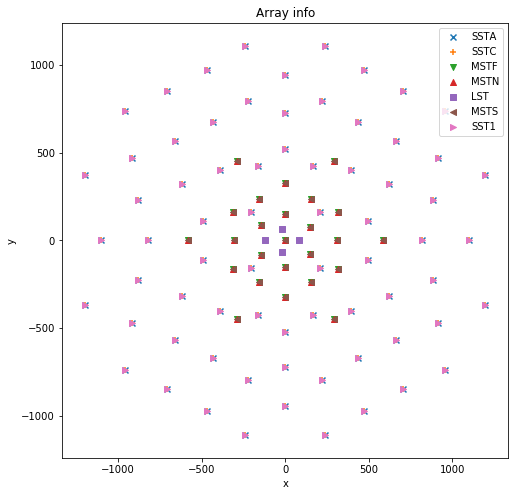

In [11]:
plot_array(array_data)

# Telescope Table

In [12]:
from gerumo.data.io import _telescope_table, _telescopes_info_attributes

In [13]:
telescopes_info = hdf5_file.root[_telescope_table[version]]
telescopes_info

/Telescope_Info (Table(7,)) 'Table of telescope data'
  description := {
  "num_pixels": UInt32Col(shape=(), dflt=0, pos=0),
  "tel_type": StringCol(itemsize=8, shape=(), dflt=b'', pos=1),
  "pixel_pos": Float32Col(shape=(2, 11328), dflt=0.0, pos=2)}
  byteorder := 'little'
  chunkshape := (2,)

In [14]:
if version == "ML2":
    for telescope in telescopes_info:
        print(telescope[_telescopes_info_attributes[version]["type"]].decode("utf-8"), 
              telescope["camera"].decode("utf-8"),
              telescope["optics"].decode("utf-8"))

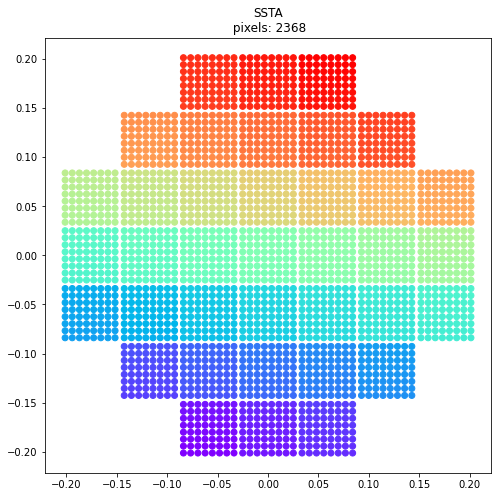

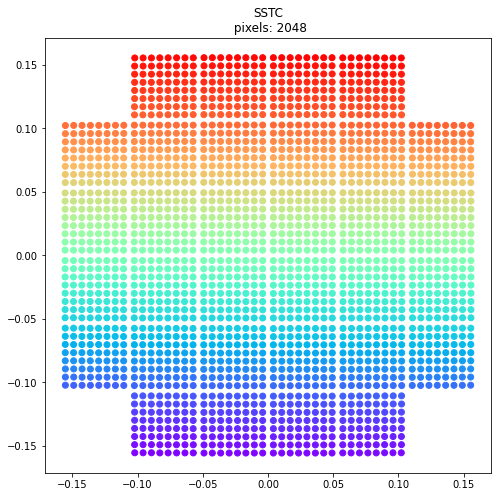

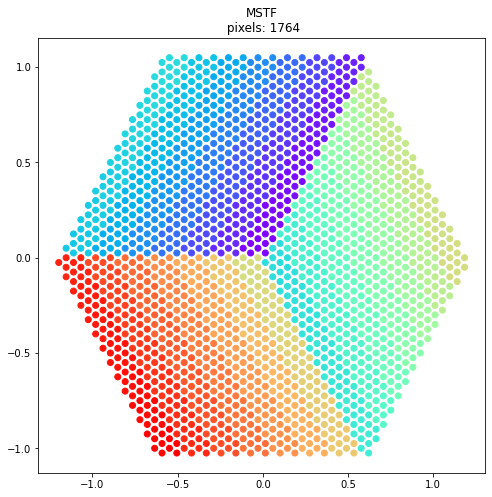

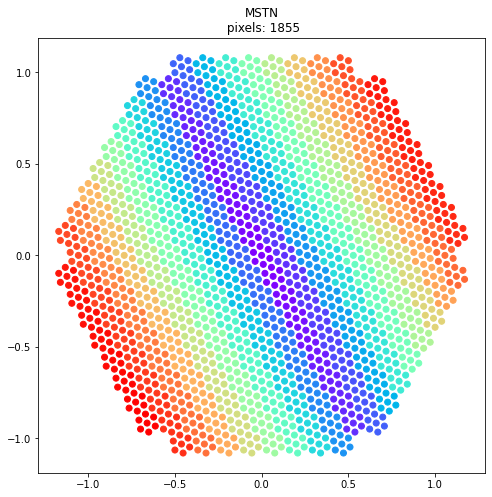

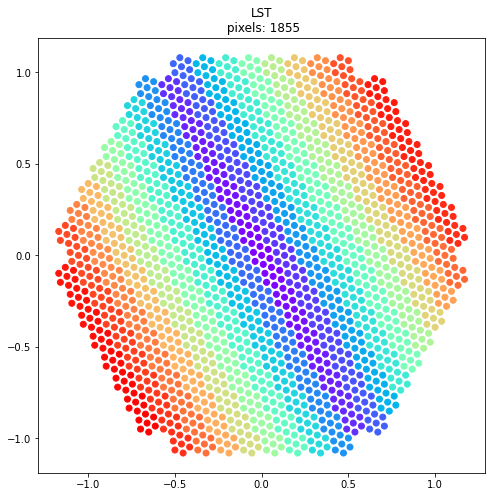

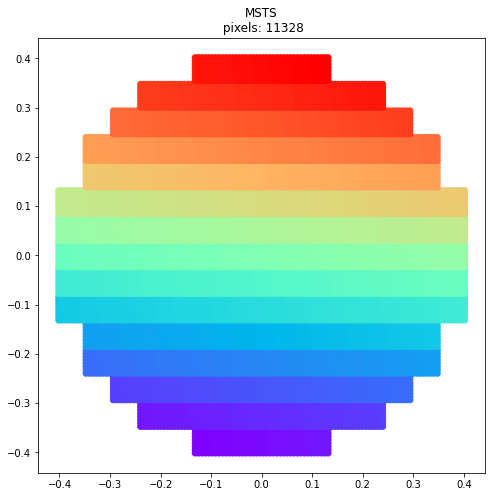

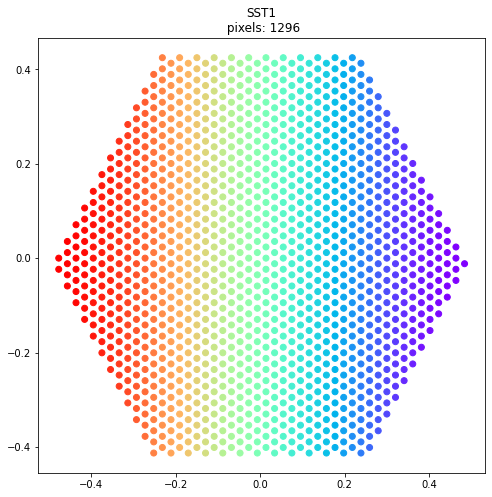

In [15]:
raw_pixpos = {}
for telescope in telescopes_info:
    type_ = telescope[_telescopes_info_attributes[version]["type"]].decode("utf-8")
    num_pixels = telescope[_telescopes_info_attributes[version]["num_pixels"]]
    if version == "ML2":
        raw_pixpos[type_] = telescope[_telescopes_info_attributes[version]["pixel_pos"]][:num_pixels, :].T
    else:
        raw_pixpos[type_] = telescope[_telescopes_info_attributes[version]["pixel_pos"]][:, :num_pixels]
    plot_telescope_geometry(type_, raw_pixpos[type_], num_pixels)

## Event Table

In [16]:
from gerumo.data.io import _events_table, _event_attributes

In [17]:
TELESCOPES_ALIAS = {
    "ML1": {
        "LST_LSTCam":    "LST", 
        "MST_FlashCam":  "MSTF", 
        "SST1M_DigiCam": "SST1"
    },
    "ML2": {
        "LST_LSTCam":    "LST_LSTCam", 
        "MST_FlashCam":  "MST_FlashCam",
        "SST1M_DigiCam": "SST1M_DigiCam"
    } 
}

In [18]:
events_info = hdf5_file.root[_events_table[version]]
events_info

/Event_Info (Table(1189,)) 'Table of Events'
  description := {
  "alt": Float32Col(shape=(), dflt=0.0, pos=0),
  "az": Float32Col(shape=(), dflt=0.0, pos=1),
  "core_x": Float32Col(shape=(), dflt=0.0, pos=2),
  "core_y": Float32Col(shape=(), dflt=0.0, pos=3),
  "event_number": UInt32Col(shape=(), dflt=0, pos=4),
  "h_first_int": Float32Col(shape=(), dflt=0.0, pos=5),
  "mc_energy": Float32Col(shape=(), dflt=0.0, pos=6),
  "particle_id": UInt8Col(shape=(), dflt=0, pos=7),
  "run_number": UInt32Col(shape=(), dflt=0, pos=8),
  "LST_indices": Int32Col(shape=(4,), dflt=0, pos=9),
  "MSTF_indices": Int32Col(shape=(25,), dflt=0, pos=10),
  "MSTN_indices": Int32Col(shape=(25,), dflt=0, pos=11),
  "MSTS_indices": Int32Col(shape=(25,), dflt=0, pos=12),
  "SST1_indices": Int32Col(shape=(70,), dflt=0, pos=13),
  "SSTA_indices": Int32Col(shape=(70,), dflt=0, pos=14),
  "SSTC_indices": Int32Col(shape=(70,), dflt=0, pos=15)}
  byteorder := 'little'
  chunkshape := (110,)

In [19]:
events_data = []
telescopes_data = []

for i, event in enumerate(hdf5_file.root[_events_table[version]]):
    # Event data
    event_unique_id = uuid.uuid4().hex[:20]
    event_data = dict(
                event_unique_id = event_unique_id,
                event_id = event[_event_attributes[version]["event_id"]] ,
                source = source,
                folder = folder,
                core_x = event[_event_attributes[version]["core_x"]],
                core_y = event[_event_attributes[version]["core_y"]],
                h_first_int = event[_event_attributes[version]["h_first_int"]],
                alt = event[_event_attributes[version]["alt"]],
                az = event[_event_attributes[version]["az"]],
                mc_energy = event[_event_attributes[version]["mc_energy"]]
    )
    events_data.append(event_data)
    
    # Observations data
    ## For each telescope type
    for telescope_type in TELESCOPES:
        telescope_type_alias = TELESCOPES_ALIAS[version][telescope_type]
        telescope_indices = f"{telescope_type_alias}_indices"
        telescopes = event[telescope_indices]
        # number of activated telescopes
        if version == "ML2":
            telescope_multiplicity = f"{telescope_type_alias}_multiplicity"
            multiplicity = event[telescope_multiplicity]
        else:
            multiplicity = np.sum(telescopes != 0)
            
        if multiplicity == 0: # No telescope of this type were activated
            continue

        # Select activated telescopes
        activation_mask = telescopes != 0
        activated_telescopes = np.arange(len(telescopes))[activation_mask]
        observation_indices = telescopes[activation_mask]

        ## For each activated telescope
        for activate_telescope, observation_indice in zip(activated_telescopes, observation_indices):
            # Telescope Data
            real_telescope_id = real_telescopes_id[telescope_type_alias][activate_telescope]
            telescope_data = dict(
                telescope_id = real_telescope_id,
                event_unique_id = event_unique_id,
                type = telescope_type,
                x = array_data[telescope_type_alias][real_telescope_id]["x"],
                y = array_data[telescope_type_alias][real_telescope_id]["y"],
                z = array_data[telescope_type_alias][real_telescope_id]["z"],
                observation_indice = observation_indice
            )
            telescopes_data.append(telescope_data)

In [20]:
pprint.pprint(events_data[0])

{'alt': 1.3098989725112915,
 'az': 6.212157726287842,
 'core_x': 85.59400177001953,
 'core_y': 710.2540893554688,
 'event_id': 9201,
 'event_unique_id': '1c028cae55894774a441',
 'folder': '/home/bapanes/Research-Now/local/ml-valpo-local/umonna/dataset/ML1',
 'h_first_int': 25809.19921875,
 'mc_energy': 10.341197967529297,
 'source': 'gamma_20deg_0deg_srun958-4920___cta-prod3_desert-2150m-Paranal-HB9_cone10.h5'}


In [21]:
pprint.pprint(telescopes_data[0])

{'event_unique_id': '1c028cae55894774a441',
 'observation_indice': 1,
 'telescope_id': 27,
 'type': 'MST_FlashCam',
 'x': -291.0849914550781,
 'y': 450.1549987792969,
 'z': 10.0}


In [22]:
events_df = pd.DataFrame(events_data)
events_df["az"] = events_df.az.apply(lambda rad: np.arctan2(np.sin(rad), np.cos(rad)))
events_df["log10_mc_energy"] = events_df["mc_energy"].apply(lambda energy: np.log10(energy))
telescope_df = pd.DataFrame(telescopes_data)

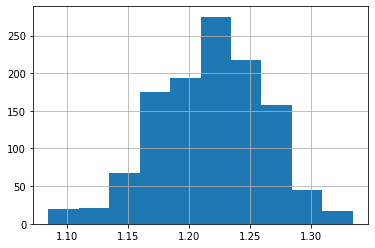

In [23]:
events_df.alt.hist();

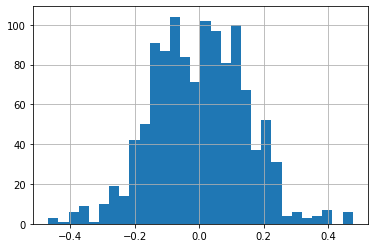

In [24]:
events_df.az.hist(bins=30);

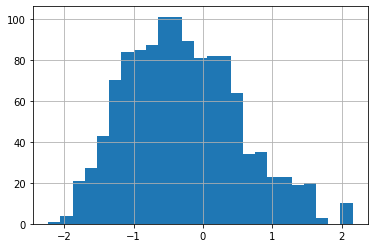

In [25]:
events_df.log10_mc_energy.hist(bins=25);

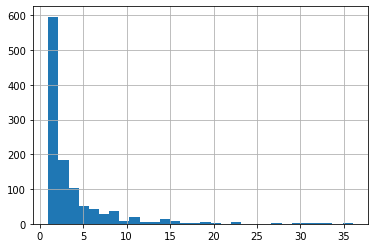

In [26]:
telescope_df.event_unique_id.value_counts().hist(bins=30);

In [27]:
dataset = pd.merge(events_df, telescope_df, on="event_unique_id", validate="1:m")
dataset

,event_unique_id,event_id,source,folder,core_x,core_y,h_first_int,alt,az,mc_energy,log10_mc_energy,telescope_id,type,x,y,z,observation_indice
0,1c028cae55894774a441,9201,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,85.594002,710.254089,25809.199219,1.309899,-0.071028,10.341198,1.014571,27,MST_FlashCam,-291.084991,450.154999,10.0,1
1,1c028cae55894774a441,9201,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,85.594002,710.254089,25809.199219,1.309899,-0.071028,10.341198,1.014571,242,SST1M_DigiCam,0.000000,723.527039,5.0,1
2,1c028cae55894774a441,9201,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,85.594002,710.254089,25809.199219,1.309899,-0.071028,10.341198,1.014571,0,SST1M_DigiCam,-220.844009,796.902954,5.0,2
3,1c028cae55894774a441,9201,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,85.594002,710.254089,25809.199219,1.309899,-0.071028,10.341198,1.014571,6,SST1M_DigiCam,0.000000,944.301025,5.0,3
4,f9f981c55f2843389058,9209,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,83.685966,357.632782,25809.199219,1.309899,-0.071028,10.341198,1.014571,15,MST_FlashCam,-154.205002,238.473999,10.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4179,918aec8dda3c4cc6b230,1984814,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,126.660355,58.289181,28113.759766,1.198047,0.066870,0.044873,-1.348014,3,LST_LSTCam,80.000000,0.000000,16.0,550
4180,af2515eaf4ef490bb957,1999207,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,-360.013489,96.287796,15664.442383,1.177590,0.029408,0.042328,-1.373375,4,LST_LSTCam,-120.000000,0.000000,16.0,551
4181,af2515eaf4ef490bb957,1999207,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,-360.013489,96.287796,15664.442383,1.177590,0.029408,0.042328,-1.373375,22,MST_FlashCam,-315.468018,162.621002,10.0,2274
4182,36ed0a2559fb4f4f9b1e,1999818,gamma_20deg_0deg_srun958-4920___cta-prod3_dese...,/home/bapanes/Research-Now/local/ml-valpo-loca...,-144.536713,549.279663,61972.238281,1.169579,0.012288,0.218616,-0.660319,18,MST_FlashCam,0.000000,325.242004,10.0,2275


# Observation Table (telescope names)

We considere only 3 telescopes:
* __ML1__: SST1, MSTF, LST
* __ML2__: SST1C_DigiCam, MST_FlashCam, LST_LSTCam

They are equivalent, except for MST, which ML2 is rotated and with a different pixel_position order.

In [28]:
from gerumo import load_camera, load_cameras
from gerumo.data.io import _images_attributes

In [29]:
for telescope in TELESCOPES:
    print(f'telescope type: {telescope}', end='\t')
    print(f'camera type: {TELESCOPE_CAMERA[telescope]}', end='\t')    
    print(f'alias: {TELESCOPES_ALIAS[version][telescope]}')

telescope type: LST_LSTCam	camera type: LSTCam	alias: LST
telescope type: MST_FlashCam	camera type: FlashCam	alias: MSTF
telescope type: SST1M_DigiCam	camera type: DigiCam	alias: SST1


## SST1


In [30]:
tel_type  = "SST1M_DigiCam"
tel_alias = TELESCOPES_ALIAS[version][tel_type]

tel_table = hdf5_file.root[tel_alias]
tel_table

/SST1 (Table(1358,)) 'Table of SST1 images'
  description := {
  "event_index": Int32Col(shape=(), dflt=0, pos=0),
  "image_charge": Float32Col(shape=(1296,), dflt=0.0, pos=1),
  "image_peak_times": Float32Col(shape=(1296,), dflt=0.0, pos=2)}
  byteorder := 'little'
  chunkshape := (12,)

In [31]:
len(tel_table)

1358

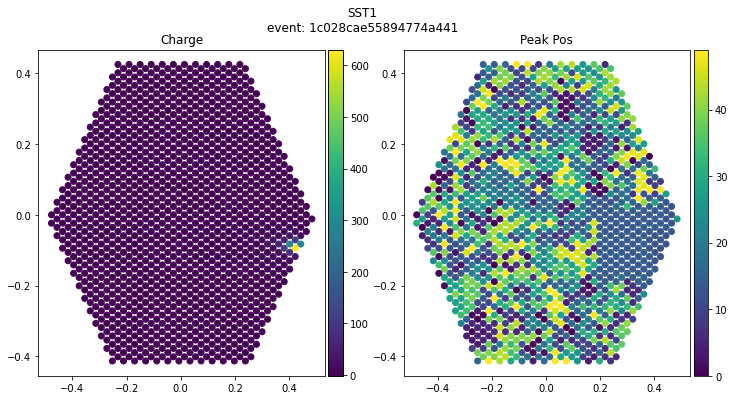

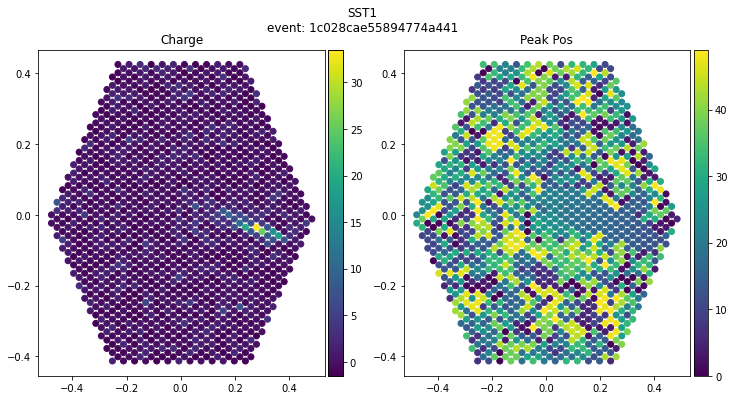

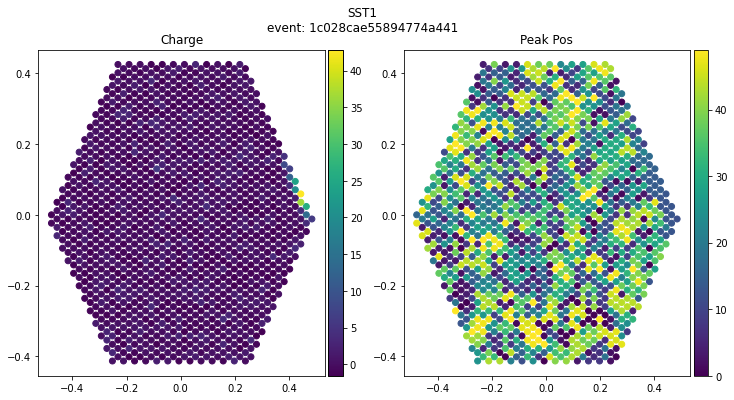

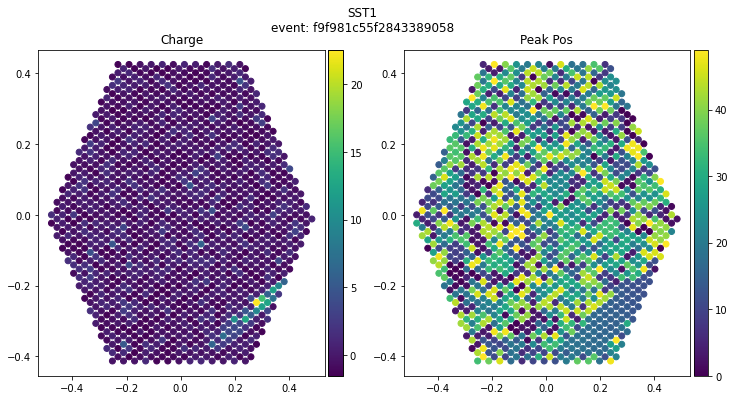

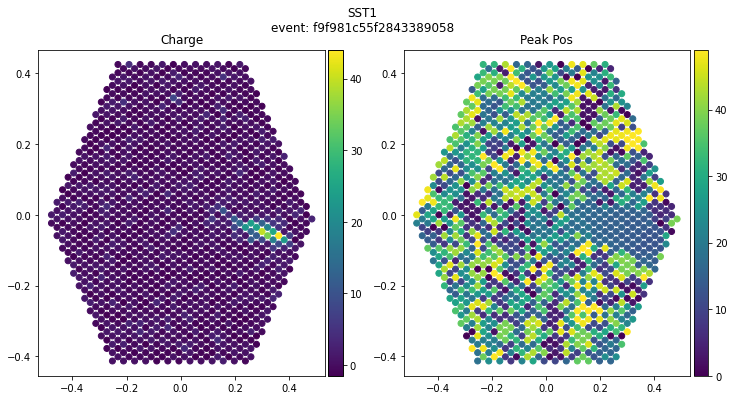

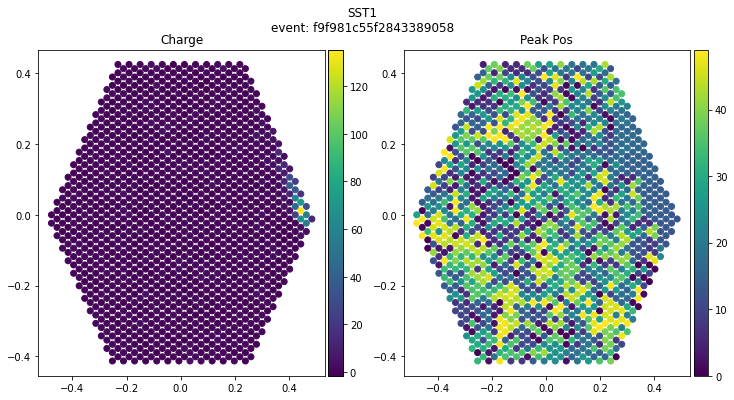

In [32]:
telescopes_data_tel = filter(lambda t: t['type'] == tel_type, telescopes_data)
for i, tel_data in enumerate(telescopes_data_tel):
    event_id = tel_data["event_unique_id"]
    image   = tel_table[tel_data["observation_indice"]]
    charge  = image[_images_attributes[version]["charge"]]
    peakpos = image[_images_attributes[version]["peakpos"]]
    pix_pos = raw_pixpos[tel_alias]
    if i <= 5:
        plot_observation_scatter(charge, peakpos, pix_pos, tel_alias, event_id)

## MST

In [33]:
tel_type  = "MST_FlashCam"
tel_alias = TELESCOPES_ALIAS[version][tel_type]

tel_table = hdf5_file.root[tel_alias]
tel_table

/MSTF (Table(2277,)) 'Table of MSTF images'
  description := {
  "event_index": Int32Col(shape=(), dflt=0, pos=0),
  "image_charge": Float32Col(shape=(1764,), dflt=0.0, pos=1),
  "image_peak_times": Float32Col(shape=(1764,), dflt=0.0, pos=2)}
  byteorder := 'little'
  chunkshape := (18,)

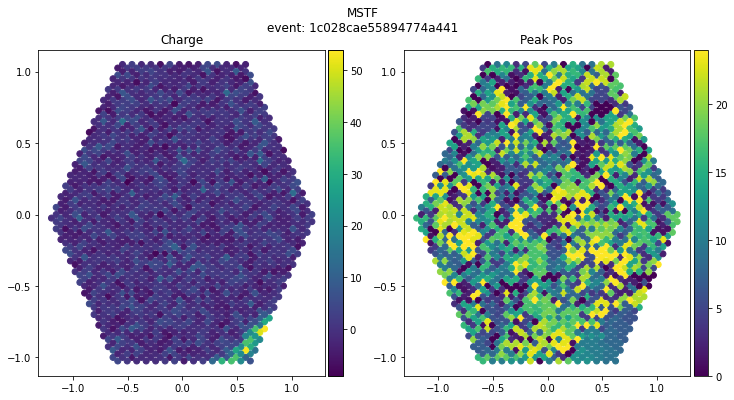

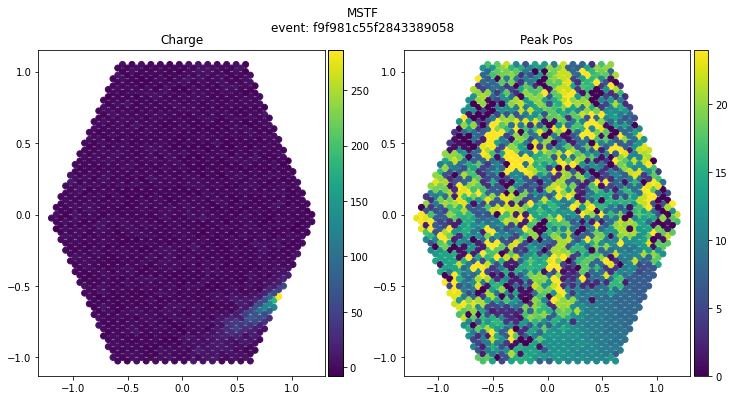

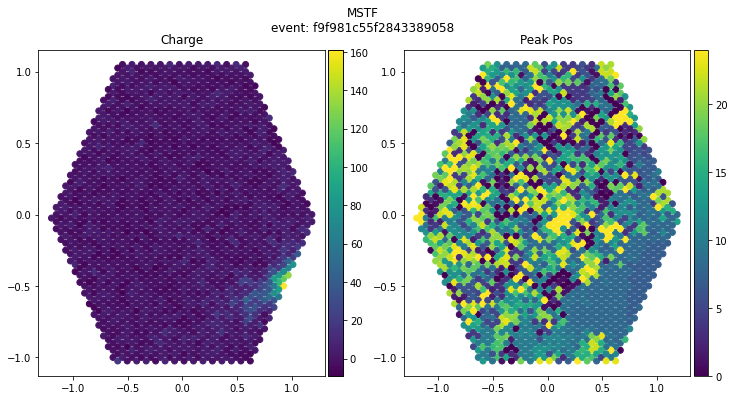

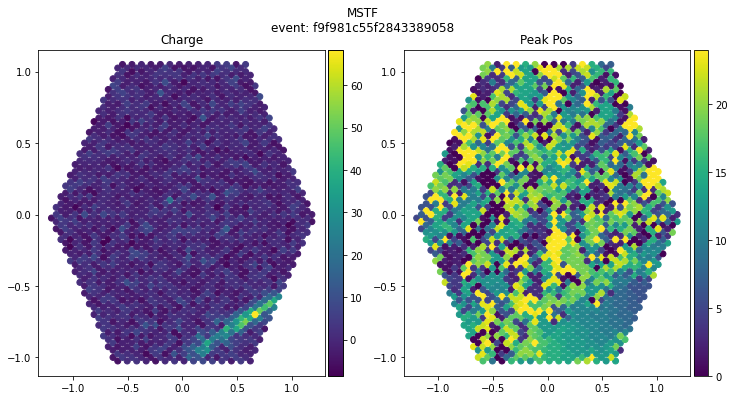

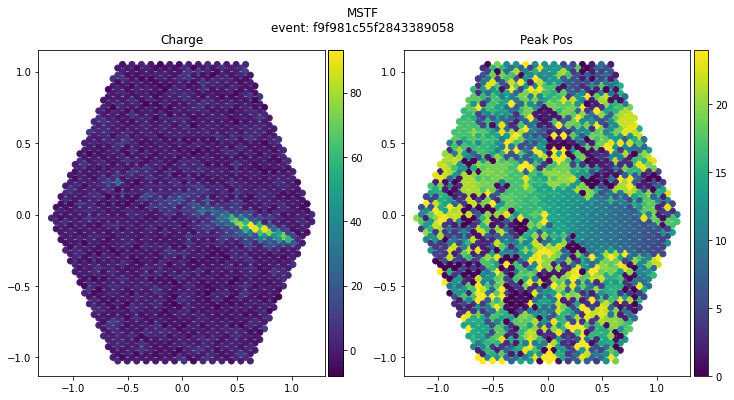

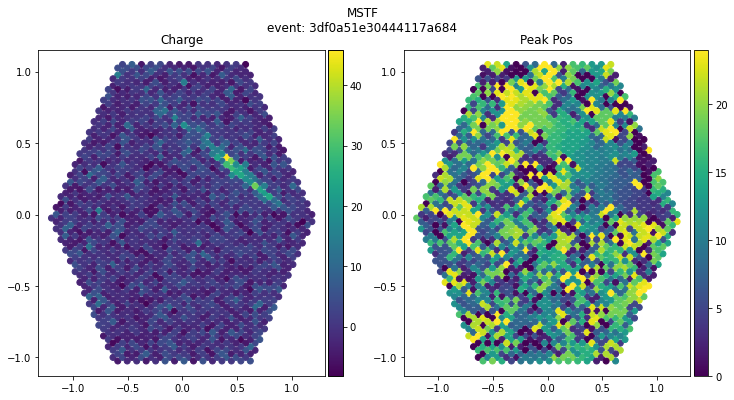

In [34]:
telescopes_data_tel = filter(lambda t: t['type'] == tel_type, telescopes_data)
for i, tel_data in enumerate(telescopes_data_tel):
    event_id = tel_data["event_unique_id"]
    image   = tel_table[tel_data["observation_indice"]]
    charge  = image[_images_attributes[version]["charge"]]
    peakpos = image[_images_attributes[version]["peakpos"]]
    pix_pos = raw_pixpos[tel_alias]
    if i <= 5:
        plot_observation_scatter(charge, peakpos, pix_pos, tel_alias, event_id)


## LST

In [35]:
tel_type  = "LST_LSTCam"
tel_alias = TELESCOPES_ALIAS[version][tel_type]

tel_table = hdf5_file.root[tel_alias]
tel_table

/LST (Table(552,)) 'Table of LST images'
  description := {
  "event_index": Int32Col(shape=(), dflt=0, pos=0),
  "image_charge": Float32Col(shape=(1855,), dflt=0.0, pos=1),
  "image_peak_times": Float32Col(shape=(1855,), dflt=0.0, pos=2)}
  byteorder := 'little'
  chunkshape := (17,)

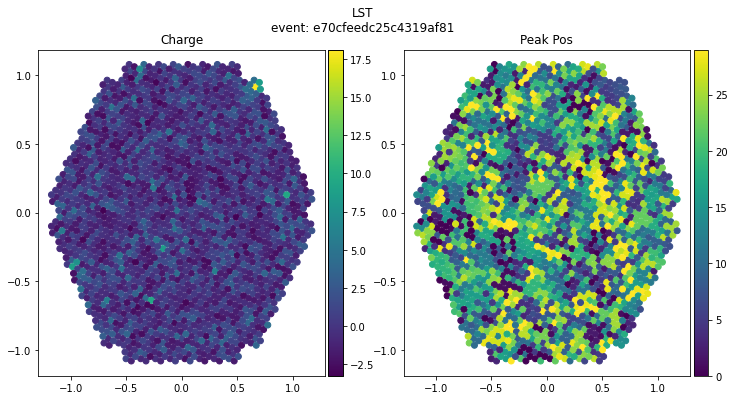

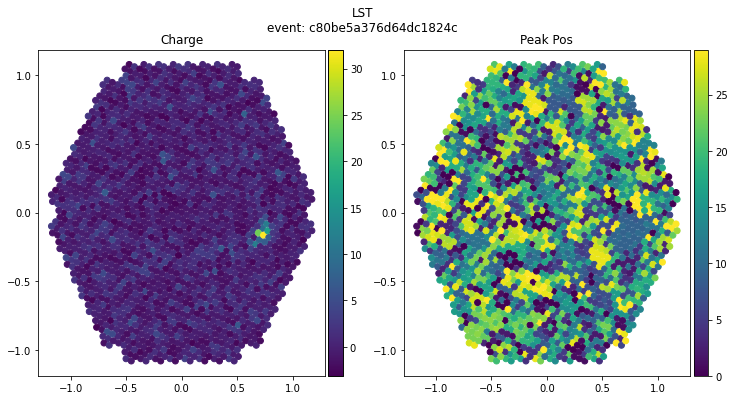

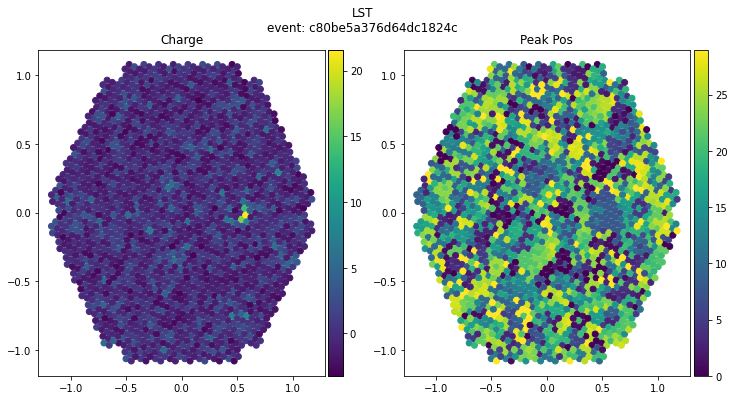

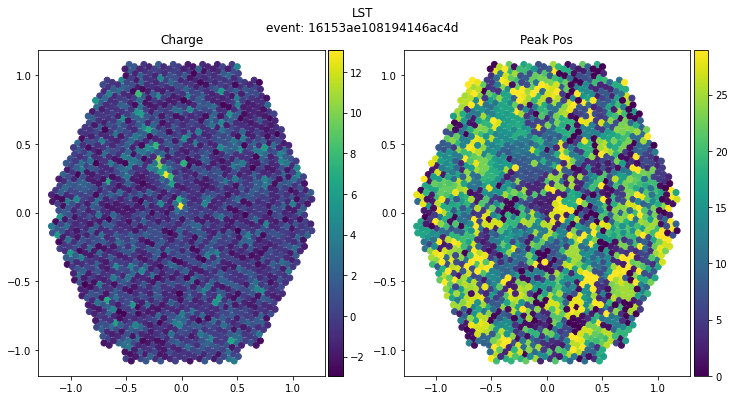

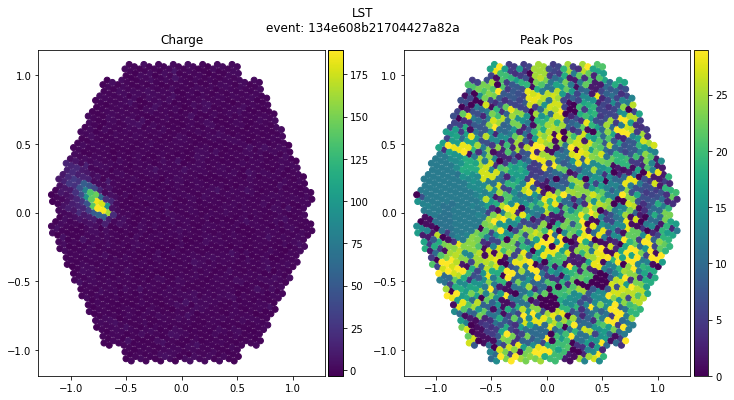

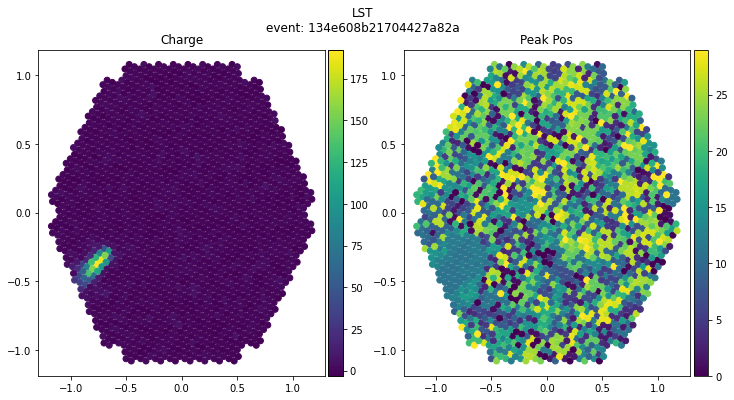

In [36]:
telescopes_data_tel = filter(lambda t: t['type'] == tel_type, telescopes_data)
for i, tel_data in enumerate(telescopes_data_tel):
    event_id = tel_data["event_unique_id"]
    image   = tel_table[tel_data["observation_indice"]]
    charge  = image[_images_attributes[version]["charge"]]
    peakpos = image[_images_attributes[version]["peakpos"]]
    pix_pos = raw_pixpos[tel_alias]
    if i <= 5:
        plot_observation_scatter(charge, peakpos, pix_pos, tel_alias, event_id)

In [37]:
hdf5_file.close()

# Generate PixPos files

In [38]:
from gerumo.data.io import _telescope_table, _telescopes_info_attributes
from gerumo.data import LST_LSTCam_align, to_simple_and_shift

inverse_alias = {TELESCOPES_ALIAS[version][t]:t for t in TELESCOPES}
modes = ('raw', 'simple', 'simple-shift')
pixpos_folder = f"gerumo/data/pixels_positions/{version}"
print(pixpos_folder)

hdf5_file = tables.open_file(hdf5_filepath, "r")
telescopes_info = hdf5_file.root[_telescope_table[version]]

raw_pixpos = {}
for telescope in telescopes_info:
    type_ = telescope[_telescopes_info_attributes[version]["type"]].decode("utf-8")
    if type_ not in inverse_alias:
        continue
    num_pixels = telescope[_telescopes_info_attributes[version]["num_pixels"]]
    type_ = inverse_alias[type_]
    if version == "ML2":
        raw_pixpos[type_] = telescope[_telescopes_info_attributes[version]["pixel_pos"]][:num_pixels, :].T
    else:
        raw_pixpos[type_] = telescope[_telescopes_info_attributes[version]["pixel_pos"]][:, :num_pixels]
print(raw_pixpos)

gerumo/data/pixels_positions/ML1
{'MST_FlashCam': array([[-0.028868, -0.072169,  0.057735, ..., -0.548483, -0.505181,
        -0.548483],
       [ 0.15    ,  0.125   ,  0.15    , ..., -0.95    , -0.975   ,
        -0.9     ]], dtype=float32), 'LST_LSTCam': array([[ 0.        , -0.00944877, -0.0472442 , ..., -0.6519913 ,
        -0.6141959 , -0.62364465],
       [ 0.        ,  0.04909909,  0.01636691, ..., -0.9656089 ,
        -0.9328767 , -0.8837776 ]], dtype=float32), 'SST1M_DigiCam': array([[ 0.4837 ,  0.46327,  0.46327, ..., -0.45645, -0.47689, -0.47689],
       [-0.0118 , -0.0472 , -0.0236 , ...,  0.0354 , -0.0236 ,  0.     ]],
      dtype=float32)}


## Raw

Not aligned pixels positions.


* 0: x 
* 1: y 

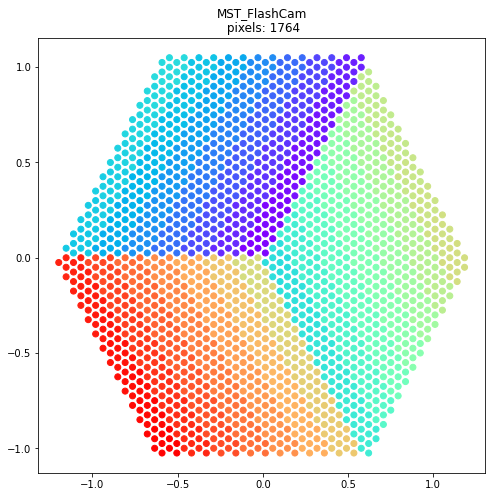

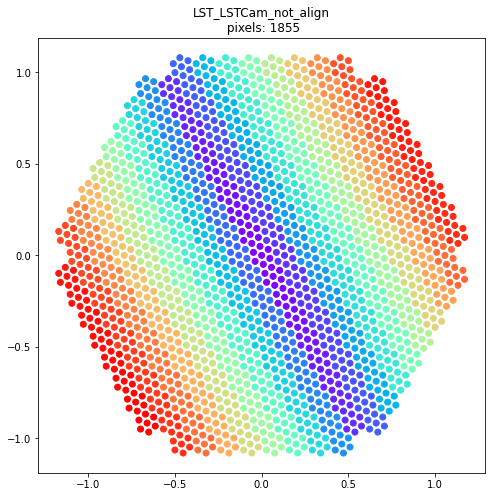

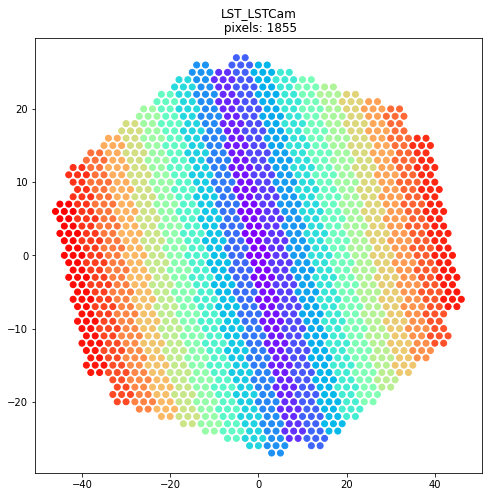

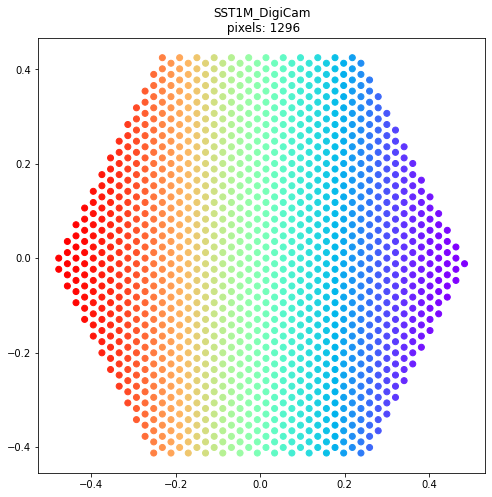

In [39]:
for telescope, pixpos in raw_pixpos.items():
    if telescope == "LST_LSTCam":
        LST_LSTCam_not_aligm = pixpos
        raw_pixpos["LST_LSTCam"] = LST_LSTCam_align(pixpos)
        pixpos = raw_pixpos["LST_LSTCam"]
        plot_telescope_geometry(telescope + '_not_align', LST_LSTCam_not_aligm)
        np.save(f'{pixpos_folder}/raw/{telescope}_not_align.npy', LST_LSTCam_not_aligm)
    plot_telescope_geometry(telescope, pixpos)
    np.savetxt(f'{pixpos_folder}/raw/{telescope}.npy', pixpos)

## Simple

Columns are aligned.

* 0: x 
* 1: y 

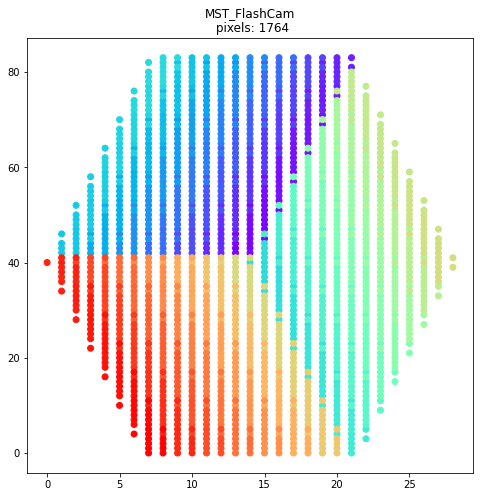

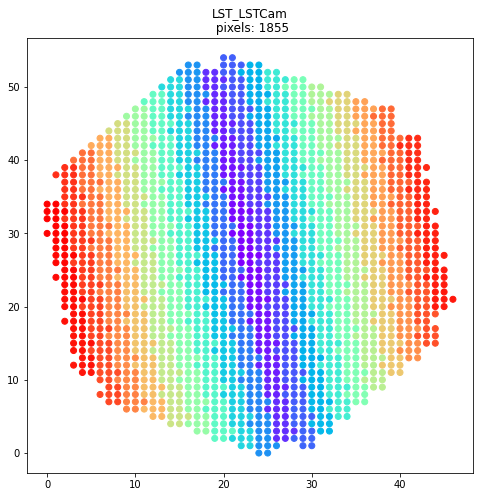

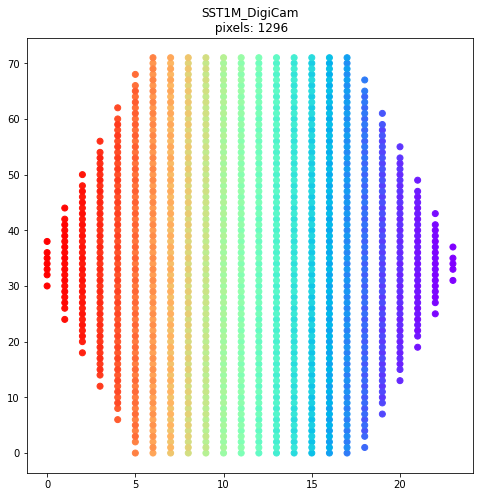

In [40]:
for telescope, pixpos in raw_pixpos.items():
    simple, _ = to_simple_and_shift(pixpos)
    plot_telescope_geometry(telescope, simple)
    np.savetxt(f'{pixpos_folder}/simple/{telescope}.npy', simple)

## Simple-shift

Columns are aligned, odd rows are shifted one column 

* 0: x right shift
* 1: x left shift
* 2: y 

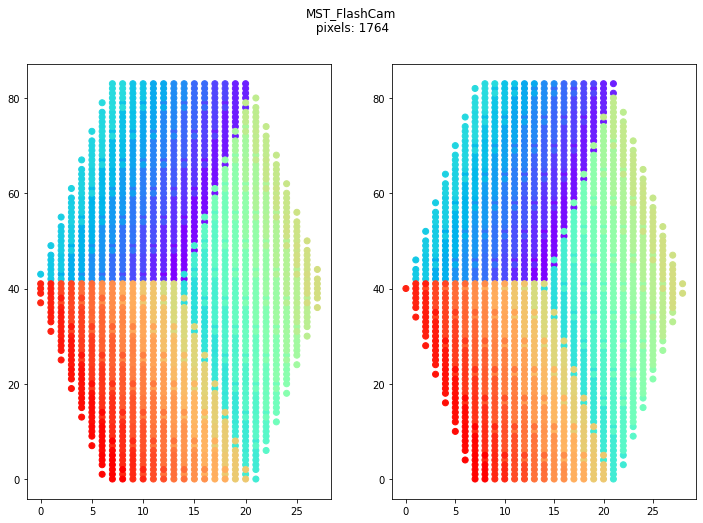

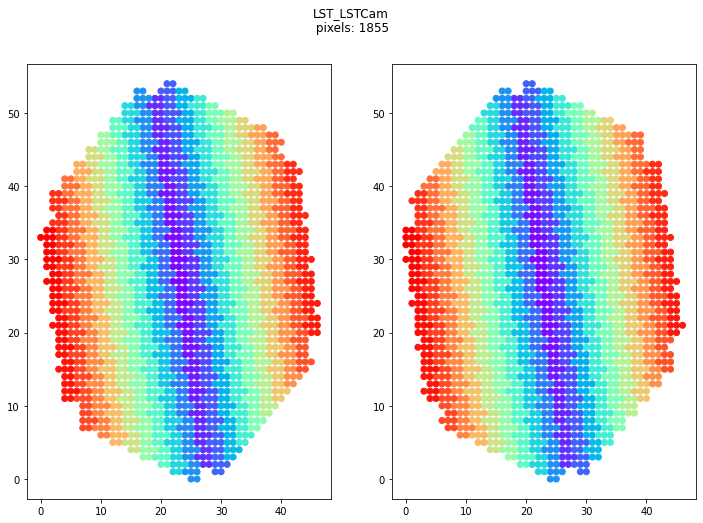

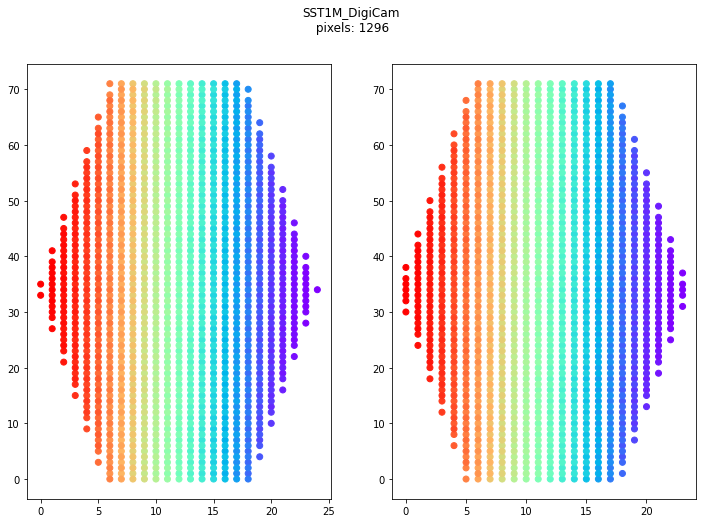

In [41]:
for telescope, pixpos in raw_pixpos.items():
    _, shift = to_simple_and_shift(pixpos)
    plot_telescope_geometry(telescope, shift)
    np.savetxt(f'{pixpos_folder}/simple_shift/{telescope}.npy', shift)

## PIXELS_POSITION constant

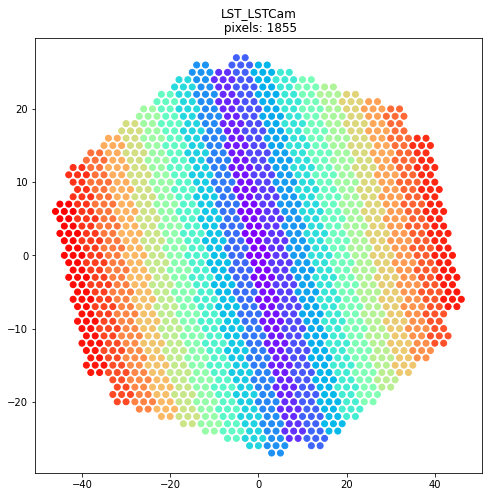

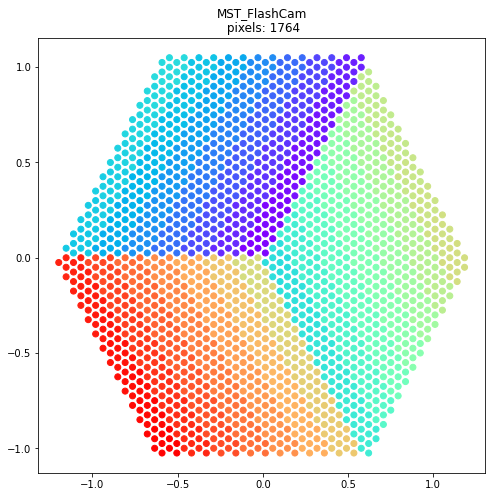

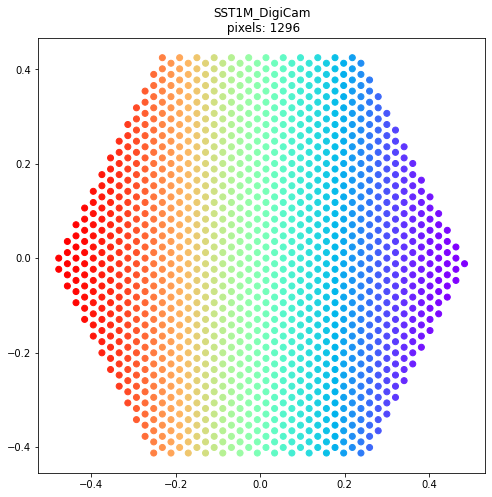

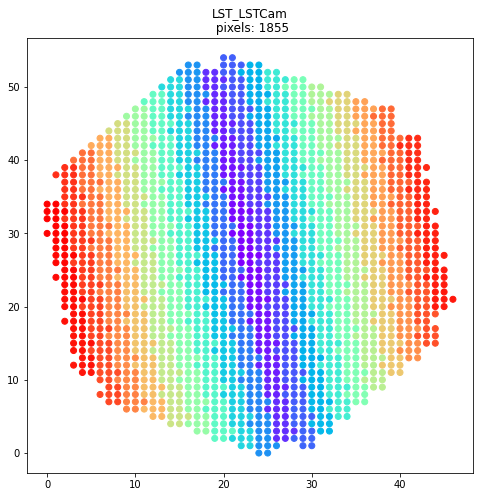

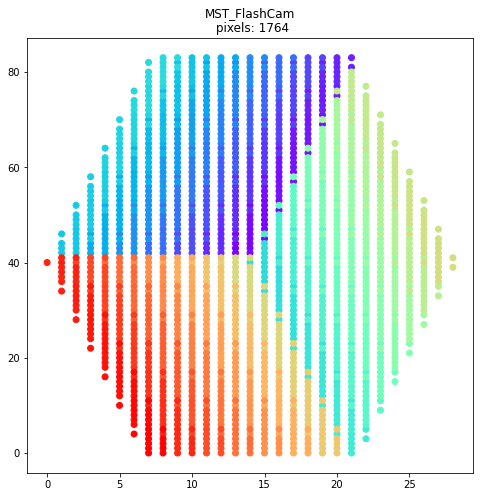

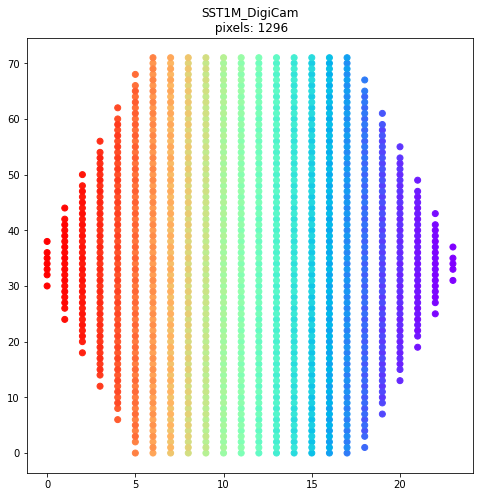

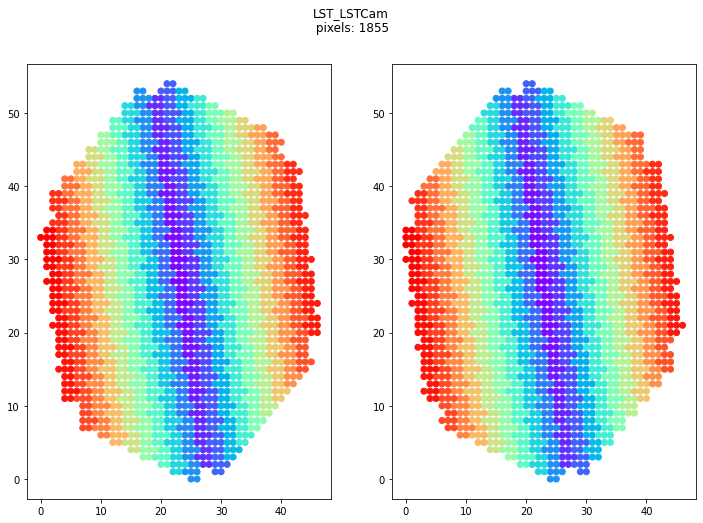

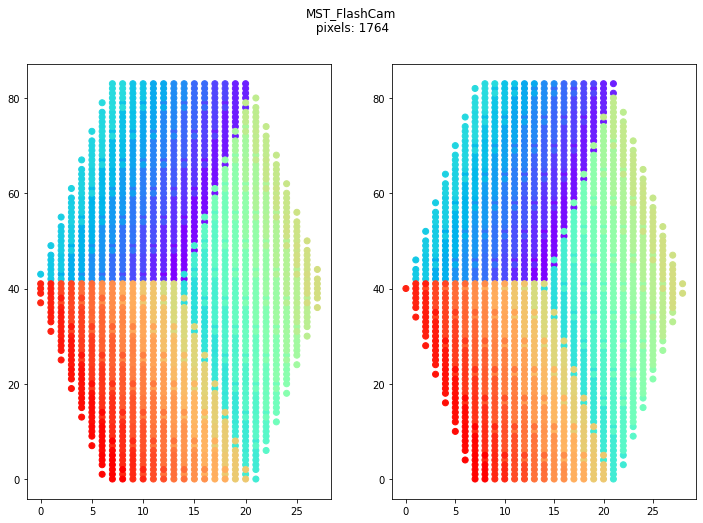

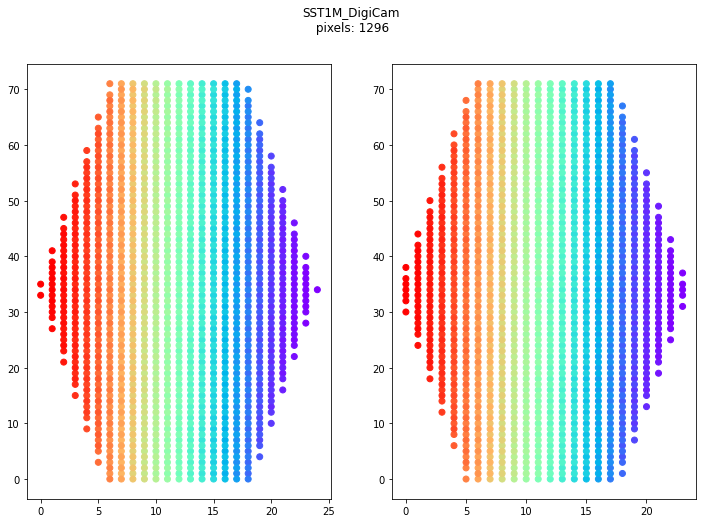

In [42]:
for mode in PIXELS_POSITION[version]:
    for tel in PIXELS_POSITION[version][mode]:
        plot_telescope_geometry(tel, PIXELS_POSITION[version][mode][tel])